2025-06-04 13:24:32.647 | INFO | weights:__init__:112 - Initialized WeightsManager with weights: tweets=0.6, error_quality=0.4, error_rate_threshold=1
ScoringAnalyzer initialized with tweets_weight=0.6, error_quality_weight=0.4

EXAMPLE USAGE

1. Connecting to validator and calculating scores...
2025-06-04 13:24:32.648 | INFO | weights:__init__:112 - Initialized WeightsManager with weights: tweets=0.6, error_quality=0.4, error_rate_threshold=1
ScoringAnalyzer initialized with tweets_weight=0.6, error_quality_weight=0.4
RESPOSE DATA: {'count': 4526, 'telemetry_data': [{'hotkey': '5GCMhygS4xLmVWXvUjEAoXEgGTBzaQoZubbgeeh3eoAv4u8R', 'uid': '218', 'timestamp': '2025-06-04 08:25:10', 'boot_time': 1748953896, 'last_operation_time': 1749025122, 'current_time': 1749025509, 'twitter_auth_errors': 0, 'twitter_errors': 0, 'twitter_ratelimit_errors': 0, 'twitter_returned_other': 0, 'twitter_returned_profiles': 0, 'twitter_returned_tweets': 1850, 'twitter_scrapes': 187, 'web_errors': 0, 'web_success

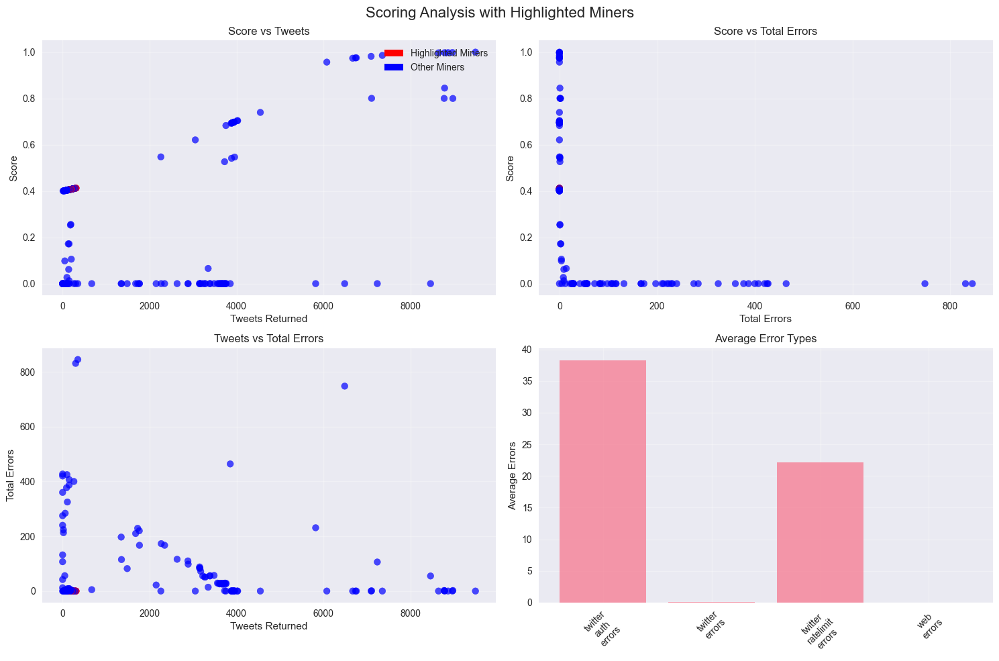


Correlation with Score:
  tweets: 0.3882
  total_errors: -0.4787

4. Showing metric correlations...


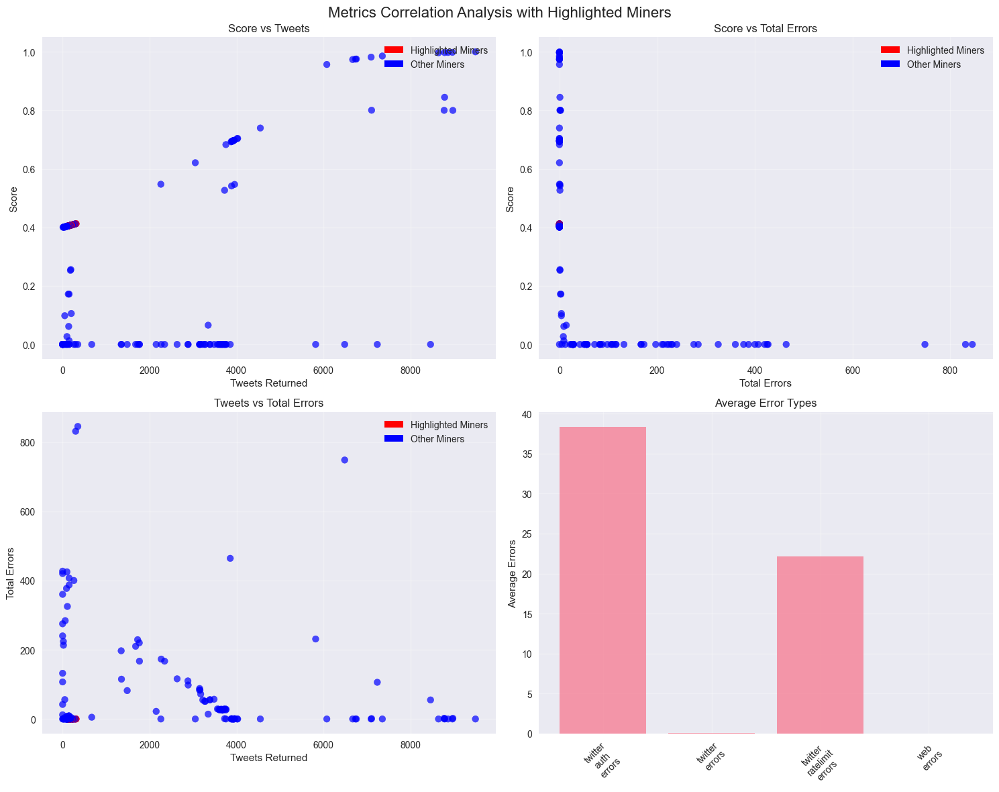


Correlation with Score:
  tweets: 0.3882
  total_errors: -0.4787

5. Top and bottom performers:

Top 5 performers:
                                             hotkey  tweets  total_errors     score
0  5EoFzzuN9ixsWWymt26EdSjWxM2cNyVT5wzuNuW7SWNWpkWu    9496             0  1.000000
1  5EhDTsKH3vpE4B3j17SuPYMcmoFKQp3spvtjbPVAbm1okGW2    8966             0  0.998320
2  5CCxuSyZ4rehmXqzbjXzt5mEUCUzhJzdNQi8tFGkpcuygzLT    8866             0  0.997916
3  5GNt8RzJU2ECauR5a8pLccNG2GemqL2MguKdYptNFY3cAUib    8786             0  0.997569
4  5GViPQu9gHAa4JHLcRPg3VhDAyRYHDxhidY8Zp7WTthTQv2s    8646             0  0.996906

Bottom 5 performers:
                                               hotkey  tweets  total_errors  score
150  5DtAJoAgJspXYvTAY6wFsY7w1NHNJjDzMxSwisvejC1Sdbia       0           275    0.0
151  5EU7PzM9hqee8xm7tp8qGe9EqfkHeYHufdx67Wgwhk3SuULb    3588            28    0.0
152  5H3YTNBLaPfKngiNPowbG1QdXwMxkDYCP1eSFs93UysFjJ2L     100           425    0.0
153  5FsLvHt5xfBiDvkybEDdG

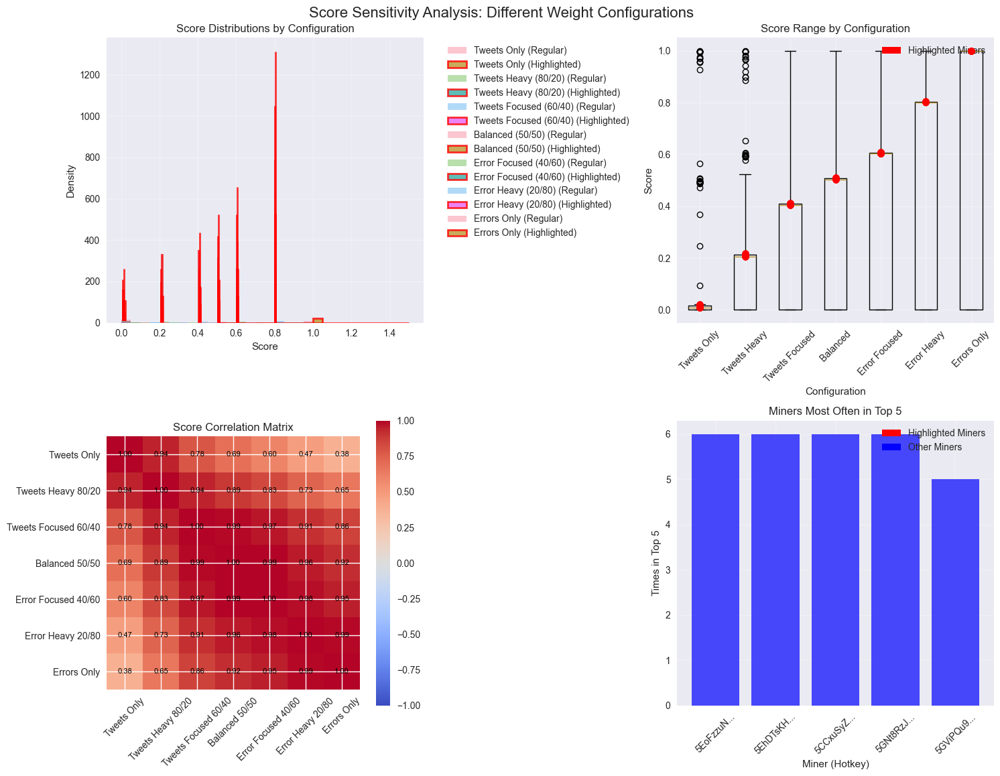


DETAILED WEIGHT CONFIGURATION COMPARISON

Tweets Only (Tweets: 1.0, Errors: 0.0)
------------------------------------------------------------
Top 3 performers:
  1. 5EoFzzuN9ixsWWymt26EdSjWxM2cNyVT5wzuNuW7SWNWpkWu... - Score: 1.0000 (Tweets: 9496, Errors: 0)
  2. 5HLARPZhcu2rZ5AMHXhA93LWU55Xz358T9jmX4egRhvorHWk... - Score: 0.9973 (Tweets: 8976, Errors: 2)
  3. 5EhDTsKH3vpE4B3j17SuPYMcmoFKQp3spvtjbPVAbm1okGW2... - Score: 0.9972 (Tweets: 8966, Errors: 0)
Score statistics:
  Mean: 0.1291
  Std:  0.2874
  Min:  0.0000
  Max:  1.0000

Tweets Heavy (80/20) (Tweets: 0.8, Errors: 0.2)
------------------------------------------------------------
Top 3 performers:
  1. 5EoFzzuN9ixsWWymt26EdSjWxM2cNyVT5wzuNuW7SWNWpkWu... - Score: 1.0000 (Tweets: 9496, Errors: 0)
  2. 5EhDTsKH3vpE4B3j17SuPYMcmoFKQp3spvtjbPVAbm1okGW2... - Score: 0.9978 (Tweets: 8966, Errors: 0)
  3. 5CCxuSyZ4rehmXqzbjXzt5mEUCUzhJzdNQi8tFGkpcuygzLT... - Score: 0.9972 (Tweets: 8866, Errors: 0)
Score statistics:
  Mean: 0.2244
  Std:

In [5]:
#!/usr/bin/env python3
"""
Jupyter notebook for testing and analyzing the new scoring system.
Provides tools to:
- Connect to remote validator and pull telemetry data
- Generate mock data for testing
- Visualize scoring results
"""

import sys
import asyncio
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from typing import List, Dict, Any, Optional
from unittest.mock import Mock
import json
import requests
from datetime import datetime, timedelta

# Add parent directory to path
sys.path.append("..")

from validator.weights import WeightsManager
from interfaces.types import NodeData

# Set up plotting style
plt.style.use("seaborn-v0_8")
sns.set_palette("husl")


class ScoringAnalyzer:
    """Main class for scoring analysis and visualization"""

    def __init__(self, tweets_weight: float = 0.6, error_quality_weight: float = 0.4):
        """
        Initialize the scoring analyzer with configurable weights.

        Args:
            tweets_weight: Weight for tweets component in scoring (default: 0.2)
            error_quality_weight: Weight for error quality component in scoring (default: 0.8)
        """
        self.tweets_weight = tweets_weight
        self.error_quality_weight = error_quality_weight
        self.mock_validator = self._create_mock_validator()
        self.weights_manager = WeightsManager(
            self.mock_validator,
            tweets_weight=tweets_weight,
            error_quality_weight=error_quality_weight,
            error_rate_threshold=1
        )
        self.node_data = []
        self.scores = {}

        print(
            f"ScoringAnalyzer initialized with tweets_weight={tweets_weight}, error_quality_weight={error_quality_weight}"
        )

    def _create_mock_validator(self):
        """Create a mock validator for testing"""
        validator = Mock()
        validator.metagraph = Mock()
        validator.metagraph.nodes = {}
        validator.node_manager = Mock()
        validator.node_manager.send_score_report = Mock(return_value=asyncio.Future())
        validator.node_manager.send_score_report.return_value.set_result(None)
        return validator

    def update_weights(self, tweets_weight: float, error_quality_weight: float):
        """
        Update the scoring weights and recreate the weights manager.

        Args:
            tweets_weight: New weight for tweets component
            error_quality_weight: New weight for error quality component
        """
        self.tweets_weight = tweets_weight
        self.error_quality_weight = error_quality_weight
        self.weights_manager = WeightsManager(
            self.mock_validator,
            tweets_weight=tweets_weight,
            error_quality_weight=error_quality_weight,
            error_rate_threshold=1
        )
        print(
            f"Updated weights: tweets_weight={tweets_weight}, error_quality_weight={error_quality_weight}"
        )

    def generate_mock_data(self, num_miners: int = 256) -> List[NodeData]:
        """Generate mock miner data with realistic performance profiles"""
        miners = []
        base_time = int(datetime.now().timestamp())

        # Define miner performance profiles
        profiles = {
            "elite": {"weight": 0.05, "tweets": (200, 400), "error_rate": (0, 2)},
            "high_performer": {
                "weight": 0.15,
                "tweets": (150, 250),
                "error_rate": (1, 5),
            },
            "reliable": {"weight": 0.25, "tweets": (100, 180), "error_rate": (2, 8)},
            "average": {"weight": 0.30, "tweets": (60, 120), "error_rate": (5, 15)},
            "struggling": {"weight": 0.15, "tweets": (20, 60), "error_rate": (10, 25)},
            "problematic": {"weight": 0.10, "tweets": (5, 30), "error_rate": (20, 50)},
        }

        # Calculate number of miners per profile
        profile_counts = {}
        remaining = num_miners
        for profile, config in profiles.items():
            count = int(num_miners * config["weight"])
            profile_counts[profile] = count
            remaining -= count

        # Distribute remaining miners
        if remaining > 0:
            profile_counts["average"] += remaining

        print(f"Generating {num_miners} miners with profiles:")
        for profile, count in profile_counts.items():
            print(f"  {profile}: {count} miners")

        uid = 0
        for profile, count in profile_counts.items():
            config = profiles[profile]

            for _ in range(count):
                # Generate performance metrics
                time_span_hours = random.uniform(1, 24)
                tweets = random.randint(*config["tweets"])
                error_rate_per_hour = random.uniform(*config["error_rate"])
                total_errors = int(error_rate_per_hour * time_span_hours)

                # Distribute errors across categories
                twitter_auth_errors = random.randint(0, max(1, total_errors // 4))
                twitter_errors = random.randint(0, max(1, total_errors // 3))
                twitter_ratelimit_errors = random.randint(0, max(1, total_errors // 4))
                web_errors = max(
                    0,
                    total_errors
                    - twitter_auth_errors
                    - twitter_errors
                    - twitter_ratelimit_errors,
                )

                node = NodeData(
                    hotkey=f"hotkey_{uid:03d}",
                    uid=uid,
                    worker_id=f"worker_{uid}",
                    timestamp=base_time,
                    boot_time=0,
                    last_operation_time=0,
                    current_time=base_time,
                    twitter_auth_errors=twitter_auth_errors,
                    twitter_errors=twitter_errors,
                    twitter_ratelimit_errors=twitter_ratelimit_errors,
                    twitter_returned_other=random.randint(0, 20),
                    twitter_returned_profiles=0,
                    twitter_returned_tweets=tweets,
                    twitter_scrapes=random.randint(tweets, tweets * 2),
                    web_errors=web_errors,
                    web_success=0,
                )

                # Add to mock metagraph
                mock_node = Mock()
                mock_node.node_id = uid
                self.mock_validator.metagraph.nodes[node.hotkey] = mock_node

                miners.append(node)
                uid += 1

        self.node_data = miners
        print(f"Generated {len(miners)} miners successfully")
        return miners

    def _parse_timestamp(self, timestamp_str: str) -> int:
        """Parse timestamp string to unix timestamp"""
        try:
            dt = datetime.strptime(timestamp_str, "%Y-%m-%d %H:%M:%S")
            return int(dt.timestamp())
        except ValueError:
            # If parsing fails, use current time
            return int(datetime.now().timestamp())

    async def connect_to_validator(self, validator_url: str) -> List[NodeData]:
        """Connect to a remote validator and pull telemetry data"""
        try:
            headers = {}

            # Attempt to fetch telemetry data
            response = requests.get(
                f"{validator_url}/monitor/telemetry/all", headers=headers, timeout=30
            )
            response.raise_for_status()

            response_data = response.json()

            print(f"RESPOSE DATA: {response_data}")
            # Handle the new response format with count and telemetry_data
            if isinstance(response_data, dict) and "telemetry_data" in response_data:
                telemetry_data = [
                    NodeData(**item) for item in response_data["telemetry_data"]
                ]
                print(
                    f"Validator reports {response_data.get('count', len(telemetry_data))} telemetry records"
                )
            else:
                # Fallback for old format
                telemetry_data = response_data

            print(f"About to get delta node nadata: {telemetry_data}")
            # Use the weights manager's method to calculate deltas
            node_data = self.weights_manager._get_delta_node_data(telemetry_data)
            print(f"NODE DATA: {node_data}")

            self.node_data = node_data
            print(
                f"Successfully processed {len(node_data)} nodes from validator telemetry"
            )
            return node_data

        except Exception as e:
            print(f"Failed to connect to validator: {e}")
            print("Falling back to mock data generation...")
            return self.generate_mock_data()

    async def calculate_scores(self) -> Dict[int, float]:
        """Calculate scores for all nodes using the weights manager"""
        if not self.node_data:
            print("No node data available. Generate mock data first.")
            return {}

        try:
            # Calculate scores using the weights manager
            uids, weights = await self.weights_manager.calculate_weights(
                self.node_data, simulation=True
            )

            # Create scores dictionary
            scores = dict(zip(uids, weights))
            self.scores = scores

            print(
                f"Calculated scores for {len(scores)} miners using weights: tweets={self.tweets_weight}, error_quality={self.error_quality_weight}"
            )
            return scores

        except Exception as e:
            print(f"Error calculating scores: {e}")
            return {}

    def create_score_dataframe(self) -> pd.DataFrame:
        """Create a pandas DataFrame with node data and scores"""
        if not self.node_data or not self.scores:
            print("No data or scores available")
            return pd.DataFrame()

        data = []
        for node in self.node_data:
            score = self.scores.get(node.uid, 0.0)

            # Calculate derived metrics
            total_errors = (
                node.twitter_auth_errors
                + node.twitter_errors
                + node.twitter_ratelimit_errors
                + node.web_errors
            )

            data.append(
                {
                    "uid": node.uid,
                    "hotkey": node.hotkey,
                    "score": score,
                    "tweets": node.twitter_returned_tweets,
                    "total_errors": total_errors,
                    "twitter_auth_errors": node.twitter_auth_errors,
                    "twitter_errors": node.twitter_errors,
                    "twitter_ratelimit_errors": node.twitter_ratelimit_errors,
                    "web_errors": node.web_errors,
                    "scrapes": node.twitter_scrapes,
                }
            )

        df = pd.DataFrame(data)
        df = df.sort_values("score", ascending=False).reset_index(drop=True)
        return df

    def plot_scores(self, figsize=(15, 8)):
        """Plot miner scores sorted by performance"""
        df = self.create_score_dataframe()
        if df.empty:
            print("No data to plot")
            return

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize, height_ratios=[3, 1])

        # Main score plot
        bars = ax1.bar(range(len(df)), df["score"], alpha=0.7)
        ax1.set_xlabel("Miner Rank (sorted by score)")
        ax1.set_ylabel("Score")
        ax1.set_title(
            f"Miner Scores Distribution ({len(df)} miners) - Tweets Weight: {self.tweets_weight}, Error Quality Weight: {self.error_quality_weight}"
        )
        ax1.grid(True, alpha=0.3)

        # Color bars based on performance tiers
        colors = []
        for score in df["score"]:
            if score > df["score"].quantile(0.9):
                colors.append("green")
            elif score > df["score"].quantile(0.7):
                colors.append("lightgreen")
            elif score > df["score"].quantile(0.3):
                colors.append("orange")
            else:
                colors.append("red")

        for bar, color in zip(bars, colors):
            bar.set_color(color)

        # Add statistics text
        stats_text = f"""Statistics:
        Mean: {df['score'].mean():.4f}
        Median: {df['score'].median():.4f}
        Std: {df['score'].std():.4f}
        Min: {df['score'].min():.4f}
        Max: {df['score'].max():.4f}"""

        ax1.text(
            0.02,
            0.98,
            stats_text,
            transform=ax1.transAxes,
            verticalalignment="top",
            bbox=dict(boxstyle="round", facecolor="white", alpha=0.8),
        )

        # Distribution histogram
        ax2.hist(df["score"], bins=50, alpha=0.7, color="skyblue", edgecolor="black")
        ax2.set_xlabel("Score")
        ax2.set_ylabel("Frequency")
        ax2.set_title("Score Distribution")
        ax2.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        # Print top and bottom performers
        print("\nTop 10 Performers:")
        print(
            df.head(10)[["uid", "hotkey", "score", "tweets", "total_errors"]].to_string(
                index=False
            )
        )

        print("\nBottom 10 Performers:")
        print(
            df.tail(10)[["uid", "hotkey", "score", "tweets", "total_errors"]].to_string(
                index=False
            )
        )

    def plot_metrics_correlation(self, figsize=(12, 8)):
        """Plot correlation between different metrics and scores"""
        df = self.create_score_dataframe()
        if df.empty:
            print("No data to plot")
            return

        fig, axes = plt.subplots(2, 2, figsize=figsize)

        # Score vs Tweets
        axes[0, 0].scatter(df["tweets"], df["score"], alpha=0.6)
        axes[0, 0].set_xlabel("Tweets Returned")
        axes[0, 0].set_ylabel("Score")
        axes[0, 0].set_title("Score vs Tweets")
        axes[0, 0].grid(True, alpha=0.3)

        # Score vs Total Errors
        axes[0, 1].scatter(df["total_errors"], df["score"], alpha=0.6, color="red")
        axes[0, 1].set_xlabel("Total Errors")
        axes[0, 1].set_ylabel("Score")
        axes[0, 1].set_title("Score vs Total Errors")
        axes[0, 1].grid(True, alpha=0.3)

        # Tweets vs Errors scatter plot
        axes[1, 0].scatter(df["tweets"], df["total_errors"], alpha=0.6, color="green")
        axes[1, 0].set_xlabel("Tweets Returned")
        axes[1, 0].set_ylabel("Total Errors")
        axes[1, 0].set_title("Tweets vs Total Errors")
        axes[1, 0].grid(True, alpha=0.3)

        # Error breakdown bar chart
        error_cols = [
            "twitter_auth_errors",
            "twitter_errors",
            "twitter_ratelimit_errors",
            "web_errors",
        ]
        error_means = [df[col].mean() for col in error_cols]

        axes[1, 1].bar(range(len(error_cols)), error_means, alpha=0.7)
        axes[1, 1].set_xticks(range(len(error_cols)))
        axes[1, 1].set_xticklabels(
            [col.replace("_", "\n") for col in error_cols], rotation=45
        )
        axes[1, 1].set_ylabel("Average Errors")
        axes[1, 1].set_title("Average Error Types")
        axes[1, 1].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        # Calculate correlations
        print("\nCorrelation with Score:")
        correlations = (
            df[["score", "tweets", "total_errors"]]
            .corr()["score"]
            .sort_values(ascending=False)
        )
        for metric, corr in correlations.items():
            if metric != "score":
                print(f"  {metric}: {corr:.4f}")


# Create analyzer instance
analyzer = ScoringAnalyzer()

# Define hotkeys to highlight
HIGHLIGHT_HOTKEYS = [
    "5FC1J2dajhmNwvvMU1TtEUNnUDh74XVHZ1dzWDQyKXuJnDce",
    "5EhfgueWHk9aUzMJFUF8fPTjScVERenayrPRPCTC4NTPucpf",
    "5H8jpfc3c4ei2F7kBXTQaQZASeBJG6v7PtAea5ScDGMd9uUM",
    "5FTXA4jhwxer3LvZDoxQY254Y8H2kNqAPW51zjcxgw9T33LC",
    "5FYkDgxZe8YH3YxLfafqmC8Kf8UDfumrqiWHyt6HT3H8NsLt",
    "5EqmfvvLqdc8csVU992mrpXZeUPmWJZv2HGsrEFzHKhRgsuS",
    "5EjUkpxMFg8TCd4QK77CpcUE7osswQYRoZbFmsURFiFPt1nZ",
    "5CrAEUFqTgY4CWoyFnB6DuuJBJ2psqmY7fQguG8rHJuCvcDb",
    "5GWQZ3TnLTE1ttucMPyXtQcWPbZ7X4zdeCf3ei9shDanF5zz",
    "5HajKMrSygyYJrnTMX57ucc7qXZnwfDtC7gAVJciXuQmwCe2",
    "5DtLpGW3R7kLrTYrgMzBLqsyu7AGEwsiKRzc1xDj3nTLw9P1",
    "5HmiaPzmLQNVH8NJqV6w5T7ezJSFESiuEVRByULJu9MDhwWP",
    "5F4f8xSaFXE1ka3dXHxGDA9WHzy3vJM4yjGsAr3vuYUP5oH3",
    "5C7rpDL2tKH1oLUj3sWMuchrJcaVF9Pg8Fx71MGDoFYwoSDB",
    "5FHo8ccjx9cve3wrqosChGWewT8cwQRTX8qqor3STLgV2K5f",
    "5HGvagJkGJEdWdvJ3XLDG8QVNmAZvchwAAAPNnXSYLwg4eYN",
    "5GHKzGXrcyM1QxEMM38qyeeA7ZPVA71GSik2ZSj6gWUQHD8m",
    "5DCrocwFrAykyrvokEw86xDMWvDMhfCg4Pno1A8bTMZWyyka",
    "5E1rQwwUiWLV54DPxhMvdjvWob4EstJCwhom94j4HkqBNidt",
    "5FvFj4yGntqtA9EDbW24N8uPzBCDuSD4D8XbgCsy8wCv4EF4",
    "5FBxMWT753FW2aMxUp7c5wFZs7kknjbaUHBJafSSfH9NZv8A",
    "5EgvwMbh6frQCSzkqmPP3mkXK5FtcJvkonfS15E4J8szW8xj",
    "5DcgFdikj1g5fmQSVKiWrcQmYp3dzyaZG8r1QifrFhCffJH8",
    "5HMxoqutYPJCe6paiW8xgdxZw2SMkrnrviZ5tKz2YxhMZkP6",
    "5GbpadENmWQTaT7UJtknTRYQQdd3mGbPCYL4ofho9BiiSQuj",
    "5ED1LFGeCCa6YPmGEG3HgSwjBYLbYEJRa3WgjUvMj9VjrymS",
    "5GeffpWeZFwz7dqkMAxLora7sxteThJhALBKmxU5kg4i1nAs",
    "5DPyo977DAozwG91i9SaysB8tkX7VL5TEAvmmxMDp4i8Hg74",
]


def highlight_hotkey(hotkey):
    """Highlight hotkey if it's in our list of interest"""
    if any(hotkey.startswith(highlight[:12]) for highlight in HIGHLIGHT_HOTKEYS):
        return f"*** {hotkey} ***"
    return hotkey


def is_highlight_hotkey(hotkey):
    """Check if hotkey should be highlighted"""
    return any(hotkey.startswith(highlight[:12]) for highlight in HIGHLIGHT_HOTKEYS)


def get_highlight_colors(df):
    """Get colors for plotting, highlighting special hotkeys"""
    colors = []
    for hotkey in df['hotkey']:
        if is_highlight_hotkey(hotkey):
            colors.append('red')  # Highlight color
        else:
            colors.append('blue')  # Default color
    return colors


# Modify the ScoringAnalyzer class to support highlighting
class HighlightingScoringAnalyzer(ScoringAnalyzer):
    def plot_scores(self):
        """Plot score analysis with highlighted hotkeys"""
        if not self.node_data:
            print("No data available. Please connect to validator first.")
            return

        df = self.create_score_dataframe()
        colors = get_highlight_colors(df)
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        fig.suptitle("Scoring Analysis with Highlighted Miners", fontsize=16)

        # Score vs Tweets with highlighting
        axes[0, 0].scatter(df["tweets"], df["score"], alpha=0.7, c=colors, s=50)
        axes[0, 0].set_xlabel("Tweets Returned")
        axes[0, 0].set_ylabel("Score")
        axes[0, 0].set_title("Score vs Tweets")
        axes[0, 0].grid(True, alpha=0.3)
        
        # Add legend
        from matplotlib.patches import Patch
        legend_elements = [Patch(facecolor='red', label='Highlighted Miners'),
                          Patch(facecolor='blue', label='Other Miners')]
        axes[0, 0].legend(handles=legend_elements, loc='upper right')

        # Score vs Total Errors with highlighting
        axes[0, 1].scatter(df["total_errors"], df["score"], alpha=0.7, c=colors, s=50)
        axes[0, 1].set_xlabel("Total Errors")
        axes[0, 1].set_ylabel("Score")
        axes[0, 1].set_title("Score vs Total Errors")
        axes[0, 1].grid(True, alpha=0.3)

        # Tweets vs Errors scatter plot with highlighting
        axes[1, 0].scatter(df["tweets"], df["total_errors"], alpha=0.7, c=colors, s=50)
        axes[1, 0].set_xlabel("Tweets Returned")
        axes[1, 0].set_ylabel("Total Errors")
        axes[1, 0].set_title("Tweets vs Total Errors")
        axes[1, 0].grid(True, alpha=0.3)

        # Error breakdown bar chart
        error_cols = [
            "twitter_auth_errors",
            "twitter_errors",
            "twitter_ratelimit_errors",
            "web_errors",
        ]
        error_means = [df[col].mean() for col in error_cols]

        axes[1, 1].bar(range(len(error_cols)), error_means, alpha=0.7)
        axes[1, 1].set_xticks(range(len(error_cols)))
        axes[1, 1].set_xticklabels(
            [col.replace("_", "\n") for col in error_cols], rotation=45
        )
        axes[1, 1].set_ylabel("Average Errors")
        axes[1, 1].set_title("Average Error Types")
        axes[1, 1].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        # Calculate correlations
        print("\nCorrelation with Score:")
        correlations = (
            df[["score", "tweets", "total_errors"]]
            .corr()["score"]
            .sort_values(ascending=False)
        )
        for metric, corr in correlations.items():
            if metric != "score":
                print(f"  {metric}: {corr:.4f}")

    def plot_metrics_correlation(self):
        """Plot correlation matrix with highlighted data points"""
        if not self.node_data:
            print("No data available. Please connect to validator first.")
            return

        df = self.create_score_dataframe()
        colors = get_highlight_colors(df)

        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        fig.suptitle("Metrics Correlation Analysis with Highlighted Miners", fontsize=16)

        # Score vs Tweets
        axes[0, 0].scatter(df["tweets"], df["score"], alpha=0.7, c=colors, s=50)
        axes[0, 0].set_xlabel("Tweets Returned")
        axes[0, 0].set_ylabel("Score")
        axes[0, 0].set_title("Score vs Tweets")
        axes[0, 0].grid(True, alpha=0.3)

        # Score vs Total Errors
        axes[0, 1].scatter(df["total_errors"], df["score"], alpha=0.7, c=colors, s=50)
        axes[0, 1].set_xlabel("Total Errors")
        axes[0, 1].set_ylabel("Score")
        axes[0, 1].set_title("Score vs Total Errors")
        axes[0, 1].grid(True, alpha=0.3)

        # Tweets vs Errors scatter plot
        axes[1, 0].scatter(df["tweets"], df["total_errors"], alpha=0.7, c=colors, s=50)
        axes[1, 0].set_xlabel("Tweets Returned")
        axes[1, 0].set_ylabel("Total Errors")
        axes[1, 0].set_title("Tweets vs Total Errors")
        axes[1, 0].grid(True, alpha=0.3)

        # Error breakdown bar chart
        error_cols = [
            "twitter_auth_errors",
            "twitter_errors",
            "twitter_ratelimit_errors",
            "web_errors",
        ]
        error_means = [df[col].mean() for col in error_cols]

        axes[1, 1].bar(range(len(error_cols)), error_means, alpha=0.7)
        axes[1, 1].set_xticks(range(len(error_cols)))
        axes[1, 1].set_xticklabels(
            [col.replace("_", "\n") for col in error_cols], rotation=45
        )
        axes[1, 1].set_ylabel("Average Errors")
        axes[1, 1].set_title("Average Error Types")
        axes[1, 1].grid(True, alpha=0.3)

        # Add legend to all scatter plots
        from matplotlib.patches import Patch
        legend_elements = [Patch(facecolor='red', label='Highlighted Miners'),
                          Patch(facecolor='blue', label='Other Miners')]
        for ax in [axes[0, 0], axes[0, 1], axes[1, 0]]:
            ax.legend(handles=legend_elements, loc='upper right')

        plt.tight_layout()
        plt.show()

        # Calculate correlations
        print("\nCorrelation with Score:")
        correlations = (
            df[["score", "tweets", "total_errors"]]
            .corr()["score"]
            .sort_values(ascending=False)
        )
        for metric, corr in correlations.items():
            if metric != "score":
                print(f"  {metric}: {corr:.4f}")


# Example usage
print("\n" + "=" * 50)
print("EXAMPLE USAGE")
print("=" * 50)

# Example 1: Connect to validator and analyze real data
print("\n1. Connecting to validator and calculating scores...")

validator_url = "http://localhost:8092"
analyzer = HighlightingScoringAnalyzer()
await analyzer.connect_to_validator(validator_url)
await analyzer.calculate_scores()

print(f"Loaded data for {len(analyzer.node_data)} miners")
print("Sample data:")
df_sample = analyzer.create_score_dataframe().head()
sample_display = df_sample[["hotkey", "tweets", "total_errors", "score"]].copy()
sample_display["hotkey"] = sample_display["hotkey"].apply(highlight_hotkey)
print(sample_display.to_string())

# Example 2: Show basic statistics
print("\n2. Basic statistics:")
df = analyzer.create_score_dataframe()
print(f"Score range: {df['score'].min():.4f} - {df['score'].max():.4f}")
print(f"Average tweets: {df['tweets'].mean():.1f}")
print(f"Average total errors: {df['total_errors'].mean():.1f}")

# Example 3: Plot the results
print("\n3. Plotting results...")
analyzer.plot_scores()

print("\n4. Showing metric correlations...")
analyzer.plot_metrics_correlation()

# Example 5: Find top and bottom performers
print("\n5. Top and bottom performers:")
df_sorted = df.sort_values("score", ascending=False)
print("\nTop 5 performers:")
top_5_display = df_sorted.head()[["hotkey", "tweets", "total_errors", "score"]].copy()
top_5_display["hotkey"] = top_5_display["hotkey"].apply(highlight_hotkey)
print(top_5_display.to_string())
print("\nBottom 5 performers:")
bottom_5_display = df_sorted.tail()[
    ["hotkey", "tweets", "total_errors", "score"]
].copy()
bottom_5_display["hotkey"] = bottom_5_display["hotkey"].apply(highlight_hotkey)
print(bottom_5_display.to_string())

# Example 6: Analyze how scores change with different weight configurations
print("\n6. Analyzing score sensitivity to different weight configurations...")

# Define different weight configurations to test
weight_configs = [
    {"tweets_weight": 1.0, "error_quality_weight": 0.0, "name": "Tweets Only"},
    {"tweets_weight": 0.8, "error_quality_weight": 0.2, "name": "Tweets Heavy (80/20)"},
    {
        "tweets_weight": 0.6,
        "error_quality_weight": 0.4,
        "name": "Tweets Focused (60/40)",
    },
    {"tweets_weight": 0.5, "error_quality_weight": 0.5, "name": "Balanced (50/50)"},
    {
        "tweets_weight": 0.4,
        "error_quality_weight": 0.6,
        "name": "Error Focused (40/60)",
    },
    {"tweets_weight": 0.2, "error_quality_weight": 0.8, "name": "Error Heavy (20/80)"},
    {"tweets_weight": 0.0, "error_quality_weight": 1.0, "name": "Errors Only"},
]

# Connect to validator and get consistent data for comparison
base_analyzer = HighlightingScoringAnalyzer()
await base_analyzer.connect_to_validator(validator_url)

# Store results for each configuration
config_results = {}
all_scores_df = pd.DataFrame()

print(f"\nTesting {len(weight_configs)} different weight configurations...")

for i, config in enumerate(weight_configs):
    print(f"\n{i+1}. Testing {config['name']} configuration...")

    # Create analyzer with specific weights
    analyzer = HighlightingScoringAnalyzer(
        tweets_weight=config["tweets_weight"],
        error_quality_weight=config["error_quality_weight"],
    )

    # Use the same validator data for fair comparison
    analyzer.node_data = base_analyzer.node_data.copy()

    # Calculate scores with this configuration
    await analyzer.calculate_scores()

    # Get results
    df = analyzer.create_score_dataframe()
    config_results[config["name"]] = df

    # Add scores to comparison dataframe
    score_column = f"score_{config['name'].replace(' ', '_').replace('(', '').replace(')', '').lower()}"
    if all_scores_df.empty:
        all_scores_df = df[["hotkey", "tweets", "total_errors"]].copy()
    all_scores_df[score_column] = df["score"]

    print(f"  Score range: {df['score'].min():.4f} - {df['score'].max():.4f}")
    print(f"  Score std: {df['score'].std():.4f}")

# Create comprehensive comparison plots with highlighting
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle("Score Sensitivity Analysis: Different Weight Configurations", fontsize=16)

# Plot 1: Score distributions for each configuration
ax1 = axes[0, 0]
for config_name, df in config_results.items():
    # Separate highlighted and regular miners for different colors
    highlighted_df = df[df['hotkey'].apply(is_highlight_hotkey)]
    regular_df = df[~df['hotkey'].apply(is_highlight_hotkey)]
    
    ax1.hist(regular_df["score"], alpha=0.4, bins=20, label=f"{config_name} (Regular)", density=True)
    if not highlighted_df.empty:
        ax1.hist(highlighted_df["score"], alpha=0.8, bins=20, label=f"{config_name} (Highlighted)", 
                density=True, edgecolor='red', linewidth=2)

ax1.set_xlabel("Score")
ax1.set_ylabel("Density")
ax1.set_title("Score Distributions by Configuration")
ax1.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
ax1.grid(True, alpha=0.3)

# Plot 2: Score ranges (box plot) with highlighted points
ax2 = axes[0, 1]
score_data = [df["score"] for df in config_results.values()]
config_names = list(config_results.keys())
box_plot = ax2.boxplot(
    score_data, tick_labels=[name.split("(")[0].strip() for name in config_names]
)

# Add highlighted points as overlays
for i, (config_name, df) in enumerate(config_results.items()):
    highlighted_df = df[df['hotkey'].apply(is_highlight_hotkey)]
    if not highlighted_df.empty:
        y_positions = highlighted_df["score"].values
        x_positions = [i + 1] * len(y_positions)  # Box plot positions are 1-indexed
        ax2.scatter(x_positions, y_positions, color='red', s=50, alpha=0.8, zorder=10)

ax2.set_xlabel("Configuration")
ax2.set_ylabel("Score")
ax2.set_title("Score Range by Configuration")
ax2.tick_params(axis="x", rotation=45)
ax2.grid(True, alpha=0.3)

# Add legend for highlighted points
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='red', label='Highlighted Miners')]
ax2.legend(handles=legend_elements, loc='upper right')

# Plot 3: Correlation between different scoring methods
ax3 = axes[1, 0]
score_cols = [col for col in all_scores_df.columns if col.startswith("score_")]
if len(score_cols) >= 2:
    correlation_matrix = all_scores_df[score_cols].corr()
    im = ax3.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
    ax3.set_xticks(range(len(score_cols)))
    ax3.set_yticks(range(len(score_cols)))
    ax3.set_xticklabels(
        [col.replace("score_", "").replace("_", " ").title() for col in score_cols],
        rotation=45,
    )
    ax3.set_yticklabels(
        [col.replace("score_", "").replace("_", " ").title() for col in score_cols]
    )
    ax3.set_title("Score Correlation Matrix")

    # Add correlation values to the plot
    for i in range(len(score_cols)):
        for j in range(len(score_cols)):
            text = ax3.text(
                j,
                i,
                f"{correlation_matrix.iloc[i, j]:.2f}",
                ha="center",
                va="center",
                color="black",
                fontsize=8,
            )

    plt.colorbar(im, ax=ax3)

# Plot 4: Top performer changes across configurations with highlighting
ax4 = axes[1, 1]
top_performers = {}
for config_name, df in config_results.items():
    top_5 = df.nlargest(5, "score")["hotkey"].tolist()
    top_performers[config_name] = top_5

# Count how often each miner appears in top 5
miner_top_counts = {}
highlighted_miner_counts = {}
for config_name, top_miners in top_performers.items():
    for miner in top_miners:
        if miner not in miner_top_counts:
            miner_top_counts[miner] = 0
        miner_top_counts[miner] += 1
        
        # Track highlighted miners separately
        if is_highlight_hotkey(miner):
            if miner not in highlighted_miner_counts:
                highlighted_miner_counts[miner] = 0
            highlighted_miner_counts[miner] += 1

# Show miners that appear in top 5 most frequently
frequent_top_miners = {
    k: v
    for k, v in sorted(miner_top_counts.items(), key=lambda x: x[1], reverse=True)
    if v > 1
}
if frequent_top_miners:
    miners = list(frequent_top_miners.keys())[:10]  # Top 10 most frequent
    counts = [frequent_top_miners[miner] for miner in miners]
    colors = ['red' if is_highlight_hotkey(miner) else 'blue' for miner in miners]
    
    bars = ax4.bar(range(len(miners)), counts, color=colors, alpha=0.7)
    ax4.set_xlabel("Miner (Hotkey)")
    ax4.set_ylabel("Times in Top 5")
    ax4.set_title("Miners Most Often in Top 5")
    ax4.set_xticks(range(len(miners)))
    ax4.set_xticklabels([miner[:8] + "..." for miner in miners], rotation=45)
    ax4.grid(True, alpha=0.3)
    
    # Add legend
    legend_elements = [Patch(facecolor='red', label='Highlighted Miners'),
                      Patch(facecolor='blue', label='Other Miners')]
    ax4.legend(handles=legend_elements, loc='upper right')
else:
    ax4.text(
        0.5,
        0.5,
        "No miners appear\nin top 5 multiple times",
        ha="center",
        va="center",
        transform=ax4.transAxes,
    )
    ax4.set_title("Top Performer Consistency")

plt.tight_layout()
plt.show()

# Print detailed comparison
print("\n" + "=" * 80)
print("DETAILED WEIGHT CONFIGURATION COMPARISON")
print("=" * 80)

for i, (config_name, df) in enumerate(config_results.items()):
    config = weight_configs[i]
    print(
        f"\n{config_name} (Tweets: {config['tweets_weight']:.1f}, Errors: {config['error_quality_weight']:.1f})"
    )
    print("-" * 60)

    # Top 3 performers
    top_3 = df.nlargest(3, "score")
    print("Top 3 performers:")
    for idx, (_, row) in enumerate(top_3.iterrows(), 1):
        highlighted_hotkey = highlight_hotkey(row["hotkey"])
        print(
            f"  {idx}. {highlighted_hotkey}... - Score: {row['score']:.4f} "
            f"(Tweets: {row['tweets']:.0f}, Errors: {row['total_errors']:.0f})"
        )

    # Statistics
    print(f"Score statistics:")
    print(f"  Mean: {df['score'].mean():.4f}")
    print(f"  Std:  {df['score'].std():.4f}")
    print(f"  Min:  {df['score'].min():.4f}")
    print(f"  Max:  {df['score'].max():.4f}")

# Show rank changes for specific miners
print("\n" + "=" * 80)
print("RANK CHANGES ACROSS CONFIGURATIONS")
print("=" * 80)

# Create rank comparison for all miners
rank_comparison = pd.DataFrame()
rank_comparison["hotkey"] = all_scores_df["hotkey"]
rank_comparison["tweets"] = all_scores_df["tweets"]
rank_comparison["total_errors"] = all_scores_df["total_errors"]

for config_name, df in config_results.items():
    df_sorted = df.sort_values("score", ascending=False).reset_index(drop=True)
    df_sorted["rank"] = df_sorted.index + 1
    rank_col = f"rank_{config_name.replace(' ', '_').replace('(', '').replace(')', '').lower()}"
    rank_comparison = rank_comparison.merge(
        df_sorted[["hotkey", "rank"]].rename(columns={"rank": rank_col}), on="hotkey"
    )
# Find miners with biggest rank changes
rank_cols = [col for col in rank_comparison.columns if col.startswith("rank_")]
if len(rank_cols) >= 2:
    rank_comparison["rank_range"] = rank_comparison[rank_cols].max(
        axis=1
    ) - rank_comparison[rank_cols].min(axis=1)
    biggest_movers = rank_comparison.nlargest(10, "rank_range")

    print("Top 10 miners with biggest rank changes:")
    for _, row in biggest_movers.iterrows():
        highlighted_hotkey = highlight_hotkey(row["hotkey"])
        is_highlighted = row["hotkey"] in HIGHLIGHT_HOTKEYS
        highlight_indicator = " [HIGHLIGHTED]" if is_highlighted else ""
        print(
            f"\n{highlighted_hotkey[:12]}... (Tweets: {row['tweets']:.0f}, Errors: {row['total_errors']:.0f}){highlight_indicator}"
        )
        print(f"  Rank range: {row['rank_range']:.0f} positions")
        for rank_col in rank_cols:
            config_name = rank_col.replace("rank_", "").replace("_", " ").title()
            print(f"  {config_name}: #{row[rank_col]:.0f}")

    # Show highlighted miners specifically
    print("\n" + "-" * 60)
    print("HIGHLIGHTED MINERS RANK CHANGES:")
    print("-" * 60)
    
    highlighted_movers = rank_comparison[rank_comparison["hotkey"].isin(HIGHLIGHT_HOTKEYS)]
    if not highlighted_movers.empty:
        highlighted_movers_sorted = highlighted_movers.sort_values("rank_range", ascending=False)
        
        for _, row in highlighted_movers_sorted.iterrows():
            highlighted_hotkey = highlight_hotkey(row["hotkey"])
            print(
                f"\n{highlighted_hotkey[:12]}... (Tweets: {row['tweets']:.0f}, Errors: {row['total_errors']:.0f}) [HIGHLIGHTED]"
            )
            print(f"  Rank range: {row['rank_range']:.0f} positions")
            for rank_col in rank_cols:
                config_name = rank_col.replace("rank_", "").replace("_", " ").title()
                print(f"  {config_name}: #{row[rank_col]:.0f}")
    else:
        print("No highlighted miners found in the dataset.")

print("\n" + "=" * 80)
print("WEIGHT CONFIGURATION ANALYSIS COMPLETE")
print("=" * 80)
print("\nKey Insights:")
print("- Compare score distributions to see how weight changes affect overall scoring")
print("- Check correlation matrix to see which configurations produce similar rankings")
print(
    "- Review rank changes to understand which miners benefit from different weightings"
)
print("- Use this analysis to choose optimal weights for your validator")
print("- RED points/bars indicate highlighted miners of special interest")